In [ ]:
import importlib
import sys
import os
sys.path.append(os.path.abspath("src"))
import normalizer
from normalizer import Normalizer
import neural_network
importlib.reload(neural_network)
from neural_network import NeuralNetwork
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

from regression import *
from classification import *
from activation_simulations import (
    train_architecture_with_activation_functions,
    visualize_results
)
import regularization_simulation
importlib.reload(regularization_simulation)
from regularization_simulation import (
    train_architecture_with_regularization,
    visualize_regularization_results
)


#### Multimodal sparse dataset

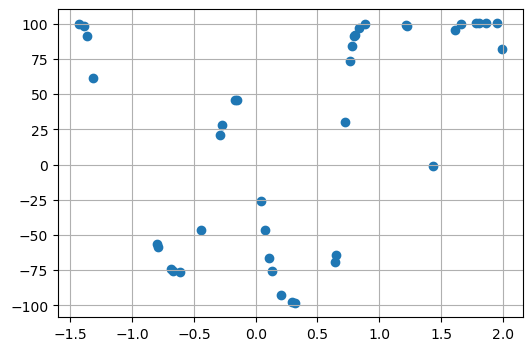

In [54]:
multimodal_training_path='data/multimodal-sparse-training.csv'
multimodal_test_path='data/multimodal-sparse-test.csv'

X_train_multimodal, Y_train_multimodal, X_test_multimodal, Y_test_multimodal=load_data(multimodal_training_path, multimodal_test_path, index_col=None)

plt.figure(figsize=(6, 4))
plt.grid(True)
plt.scatter(X_train_multimodal, Y_train_multimodal)

In [55]:
normalizer_multimodal = Normalizer()
X_train_multimodal_normalized, Y_train_multimodal_normalized = normalizer_multimodal.fit_transform(X_train_multimodal, Y_train_multimodal)
X_test_multimodal_normalized, Y_test_multimodal_normalized = normalizer_multimodal.transform(X_test_multimodal, Y_test_multimodal)

Epoch 0, Training Loss: 0.294090, Test Loss: 0.256067
Epoch 10000, Training Loss: 0.001678, Test Loss: 0.004673
Epoch 20000, Training Loss: 0.000142, Test Loss: 0.003245
Epoch 30000, Training Loss: 0.000111, Test Loss: 0.003100
Epoch 40000, Training Loss: 0.000180, Test Loss: 0.002964
Epoch 50000, Training Loss: 0.000081, Test Loss: 0.002766
Epoch 60000, Training Loss: 0.000129, Test Loss: 0.003012
Epoch 70000, Training Loss: 0.000070, Test Loss: 0.002832
Epoch 80000, Training Loss: 0.000074, Test Loss: 0.002820
Epoch 90000, Training Loss: 0.000064, Test Loss: 0.002843
Epoch 100000, Training Loss: 0.000070, Test Loss: 0.002658
Epoch 110000, Training Loss: 0.000030, Test Loss: 0.002734
Epoch 120000, Training Loss: 0.000022, Test Loss: 0.002706
Epoch 130000, Training Loss: 0.000023, Test Loss: 0.002692
Epoch 140000, Training Loss: 0.000021, Test Loss: 0.002671


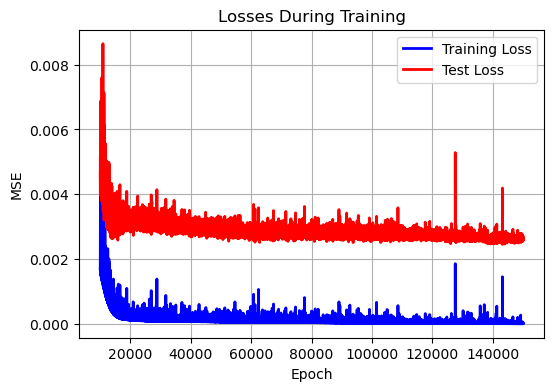

In [ ]:
#plotting last 100 000 epochs on training and test losses
nn_multimodal = NeuralNetwork(task="regression", layers=[1, 30, 30, 30, 1], activation='relu',weights_initialize='He')
nn_multimodal.train(learning_rate=0.01, X_train=X_train_multimodal_normalized, y_train=Y_train_multimodal_normalized, 
                          X_test=X_test_multimodal_normalized, y_test=Y_test_multimodal_normalized, 
                          batch_size=32, epochs=150000, verbose_interval=10000, n_last_training_epochs=140000,
                          optimizer="momentum", momentum_coeff=0.9)

In [96]:
Y_pred_denorm=normalizer_multimodal.denormalize_Y(nn_multimodal.predict(X_test_multimodal_normalized))
mse_test = np.mean((Y_pred_denorm - Y_test_multimodal) ** 2)
print(f"MSE on the test set (on non-normalized data): {mse_test}")

MSE on the test set (on non-normalized data): 102.72135349667491


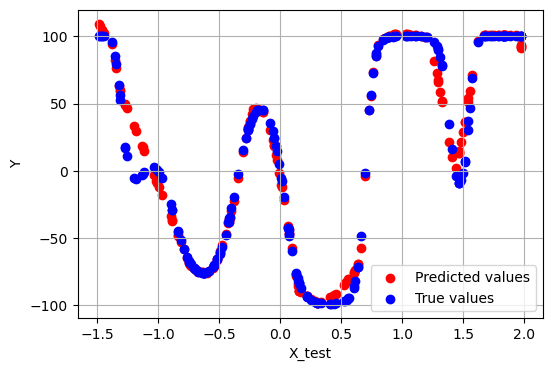

In [97]:
plot_fitted_vs_actual(X_test_multimodal, Y_test_multimodal, Y_pred_denorm, "test")

Training stability decreased slightly in the final epochs, although no clear signs of overfitting were observed.

Epoch 0, Training Loss: 0.261326, Test Loss: 0.295506
Epoch 10000, Training Loss: 0.000186, Test Loss: 0.004353
Epoch 20000, Training Loss: 0.000136, Test Loss: 0.004124
Epoch 30000, Training Loss: 0.000123, Test Loss: 0.003759
Epoch 40000, Training Loss: 0.000104, Test Loss: 0.003566
Epoch 50000, Training Loss: 0.000111, Test Loss: 0.003570
Epoch 60000, Training Loss: 0.000106, Test Loss: 0.003282
Epoch 70000, Training Loss: 0.000106, Test Loss: 0.003180
Epoch 80000, Training Loss: 0.000030, Test Loss: 0.002700
Epoch 90000, Training Loss: 0.000015, Test Loss: 0.002671
Epoch 100000, Training Loss: 0.000015, Test Loss: 0.002676
Epoch 110000, Training Loss: 0.000015, Test Loss: 0.002602
Epoch 120000, Training Loss: 0.000014, Test Loss: 0.002542
Epoch 130000, Training Loss: 0.000014, Test Loss: 0.002513
Epoch 140000, Training Loss: 0.000014, Test Loss: 0.002434


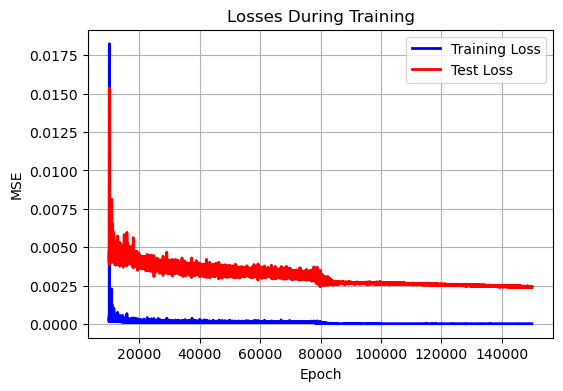

In [128]:
#more complex architecture with 30 neurons in 4 hidden layers, other parameters the same
nn_multimodal = NeuralNetwork(task="regression", layers=[1, 30, 30, 30, 30, 1], activation='relu',weights_initialize='He')
nn_multimodal.train(learning_rate=0.1, X_train=X_train_multimodal_normalized, y_train=Y_train_multimodal_normalized, 
                          X_test=X_test_multimodal_normalized, y_test=Y_test_multimodal_normalized, 
                          batch_size=32, epochs=150000, verbose_interval=10000, n_last_training_epochs=140000,
                          optimizer="momentum", momentum_coeff=0.9)

In [129]:
Y_pred_denorm=normalizer_multimodal.denormalize_Y(nn_multimodal.predict(X_test_multimodal_normalized))
mse_test = np.mean((Y_pred_denorm - Y_test_multimodal) ** 2)
print(f"MSE on the test set (on non-normalized data): {mse_test}")

MSE on the test set (on non-normalized data): 95.6888412598206


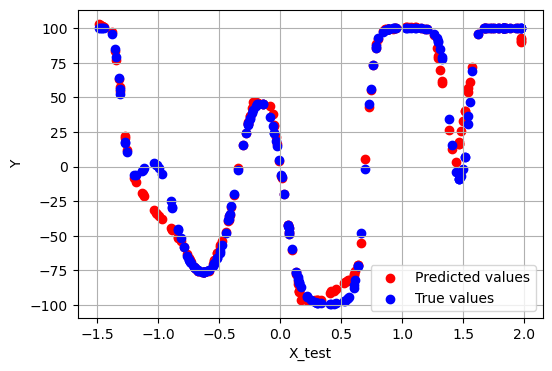

In [131]:
plot_fitted_vs_actual(X_test_multimodal, Y_test_multimodal, Y_pred_denorm, "test")

early stopping

Epoch 0, Training Loss: 0.108750, Test Loss: 0.095287
Early stopping due to no improvment in test loss after 1000 epochs


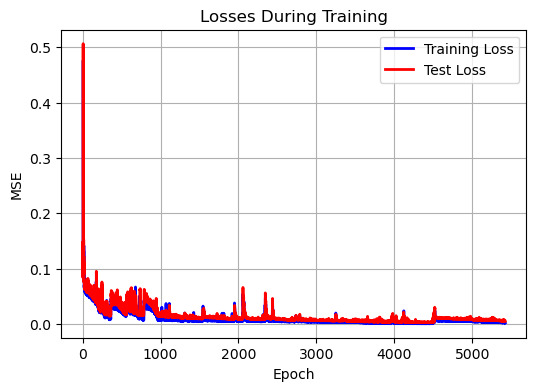

In [ ]:
nn_multimodal_early_stopping = NeuralNetwork(task="regression", layers=[1, 30, 30, 30, 30, 1], activation='relu',weights_initialize='He')
nn_multimodal_early_stopping.train(learning_rate=0.1, X_train=X_train_multimodal_normalized, y_train=Y_train_multimodal_normalized, 
                          X_test=X_test_multimodal_normalized, y_test=Y_test_multimodal_normalized, 
                          batch_size=32, epochs=150000, verbose_interval=10000, n_last_training_epochs=140000,
                          optimizer="momentum", momentum_coeff=0.9, early_stopping=True, patience=1000)

In [65]:
Y_pred_denorm=normalizer_multimodal.denormalize_Y(nn_multimodal_early_stopping.predict(X_test_multimodal_normalized))
mse_test = np.mean((Y_pred_denorm - Y_test_multimodal) ** 2)
print(f"MSE on the test set (on non-normalized data): {mse_test}")

MSE on the test set (on non-normalized data): 82.5393482838976


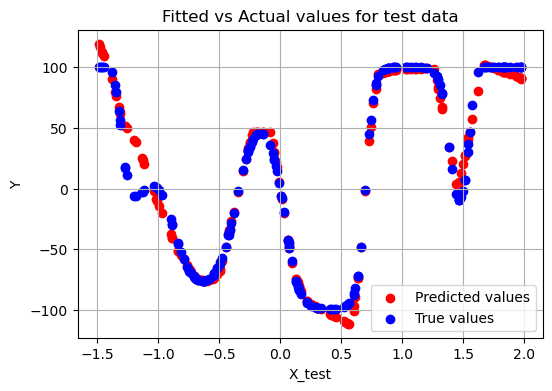

In [59]:
plot_fitted_vs_actual(X_test_multimodal, Y_test_multimodal, Y_pred_denorm, "test")

cool smaller MSE on test dataset and shorter training time

L1 regularization

In [162]:
results_ml_L1=train_architecture_with_regularization(X_train=X_train_multimodal_normalized, Y_train=Y_train_multimodal_normalized, 
                                                      X_test=X_test_multimodal_normalized, Y_test=Y_test_multimodal_normalized, 
                              task='regression', layers=[1, 30, 30, 30, 30, 1], activation_function='relu', 
                              epochs=150000, batch_size=32, learning_rate=0.1, optimizer="momentum", 
                              regularization_types=['L1'], regularization_values=[[0.00, 0.0001, 0.001, 0.01, 0.1, 1.0]], data_normalized=True, normalizer=normalizer_multimodal)

Training with regularization: L1
  λ = 0.0
  λ = 0.0001
  λ = 0.001
  λ = 0.01
  λ = 0.1
  λ = 1.0


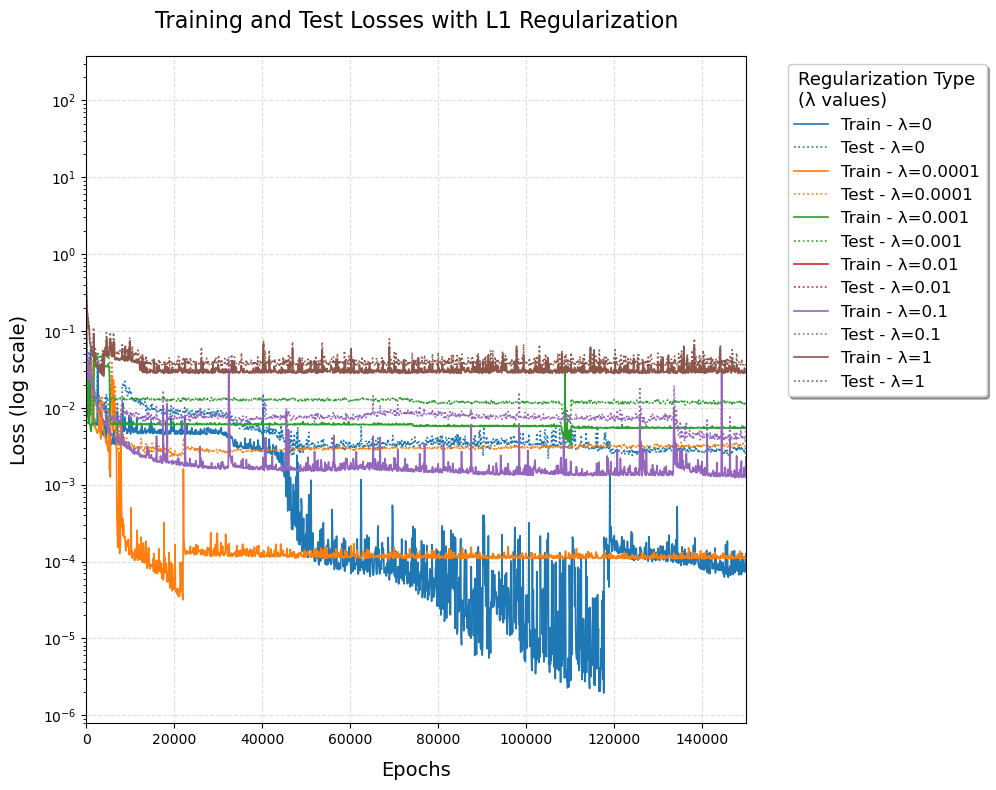

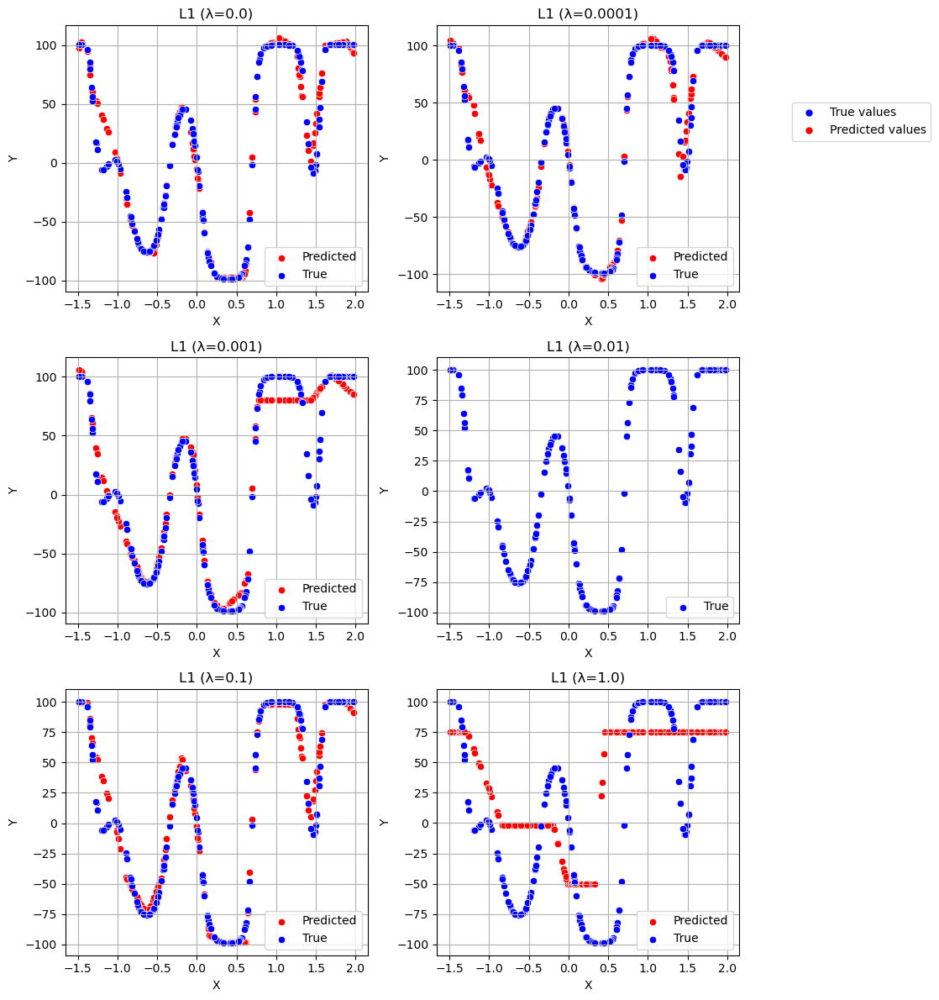

Regression Task Evaluation Metric per Regularization


,Regularization,Regression Eval Metric (MSE)
0,L1 (λ=0.0),116.54
1,L1 (λ=0.0001),128.22
2,L1 (λ=0.001),465.76
3,L1 (λ=0.01),nan
4,L1 (λ=0.1),134.67
5,L1 (λ=1.0),3642.18


Training Time per Regularization


,Regularization,Training Time (s)
0,L1 (λ=0.0),123.8
1,L1 (λ=0.0001),123.69
2,L1 (λ=0.001),132.31
3,L1 (λ=0.01),147.47
4,L1 (λ=0.1),152.91
5,L1 (λ=1.0),134.42


In [163]:
visualize_regularization_results(results=results_ml_L1, task="regression", X_test=X_test_multimodal, Y_test=Y_test_multimodal, log_scale=True)

no visible improvement with L1 regularization

L2 regularization

In [159]:
results_ml_L2=train_architecture_with_regularization(X_train=X_train_multimodal_normalized, Y_train=Y_train_multimodal_normalized, 
                                                      X_test=X_test_multimodal_normalized, Y_test=Y_test_multimodal_normalized, 
                              task='regression', layers=[1, 30, 30, 30, 30, 1], activation_function='relu', 
                              epochs=150000, batch_size=32, learning_rate=0.1, optimizer="momentum", 
                              regularization_types=['L2'], regularization_values=[[0.00, 0.0001, 0.001, 0.01, 0.1, 1.0]], data_normalized=True, normalizer=normalizer_multimodal)

Training with regularization: L2
  λ = 0.0
  λ = 0.0001
  λ = 0.001
  λ = 0.01
  λ = 0.1
  λ = 1.0


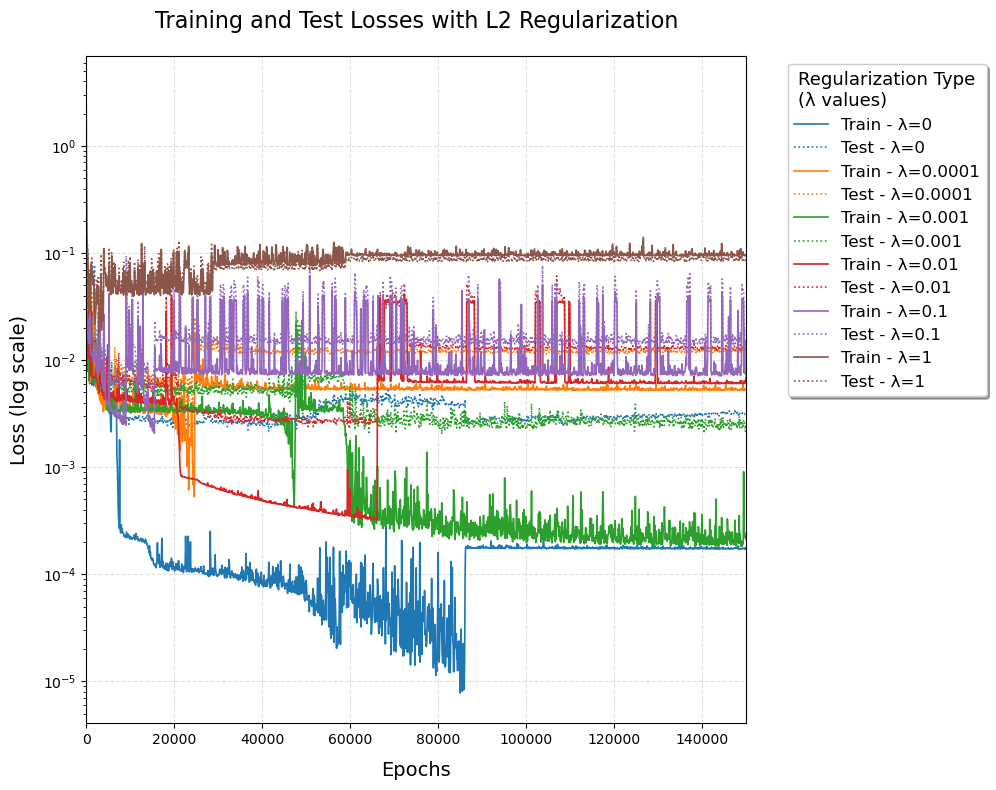

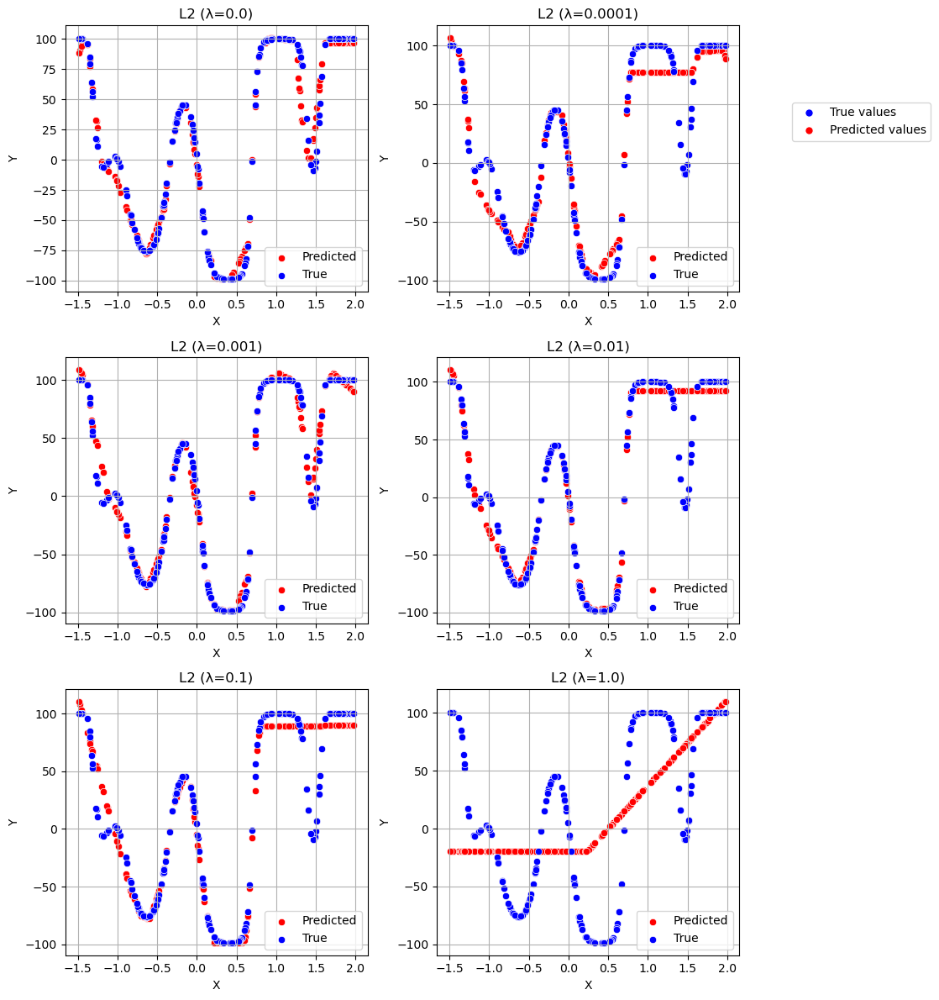

Regression Task Evaluation Metric per Regularization


,Regularization,Regression Eval Metric (MSE)
0,L2 (λ=0.0),125.04
1,L2 (λ=0.0001),470.31
2,L2 (λ=0.001),95.07
3,L2 (λ=0.01),516.71
4,L2 (λ=0.1),522.15
5,L2 (λ=1.0),3230.46


Training Time per Regularization


,Regularization,Training Time (s)
0,L2 (λ=0.0),123
1,L2 (λ=0.0001),121.17
2,L2 (λ=0.001),131.46
3,L2 (λ=0.01),120.83
4,L2 (λ=0.1),120.48
5,L2 (λ=1.0),119.71


In [160]:
visualize_regularization_results(results=results_ml_L2, task="regression", X_test=X_test_multimodal, Y_test=Y_test_multimodal, log_scale=True)

#### Rings5-sparse dataset

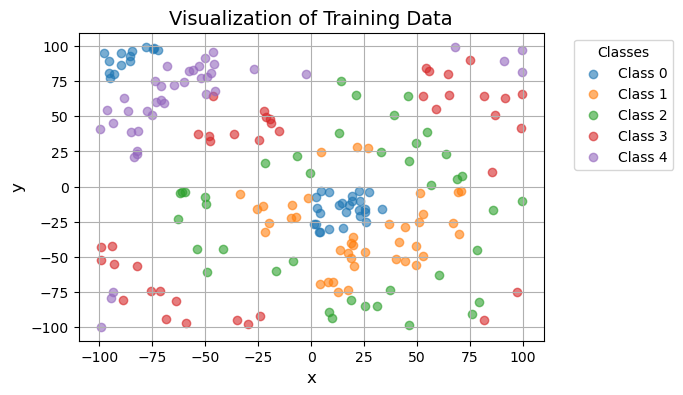

In [165]:
rings5_training_path='data/rings5-sparse-training.csv'
rings5_test_path='data/rings5-sparse-test.csv'

X_train_rings5, Y_train_rings5, X_test_rings5, Y_test_rings5, num_classes=load_data_classification(rings5_training_path, rings5_test_path, index_col=None)

visualize_data_classification(X_train_rings5, Y_train_rings5, num_classes)

In [165]:
#ommiting linear activatiom function
activations=['sigmoid', 'tanh', 'relu']
#defining model parameters
task = 'classification'
layers = [2, 20, num_classes]
epochs = 20000
batch_size = 32
learning_rate = 0.01
optimizer = 'RMSprop'
results = train_architecture_with_activation_functions(activations=activations, task=task, layers=layers, epochs=epochs, 
                                             batch_size=batch_size, learning_rate=learning_rate, optimizer=optimizer,
                                             X_train=X_train_rings5, Y_train=Y_train_rings5,
                                             X_test=X_test_rings5, Y_test=Y_test_rings5)

Training architecture with sigmoid
Training architecture with tanh
Training architecture with relu


Architecture with layers: [2, 20, 5]


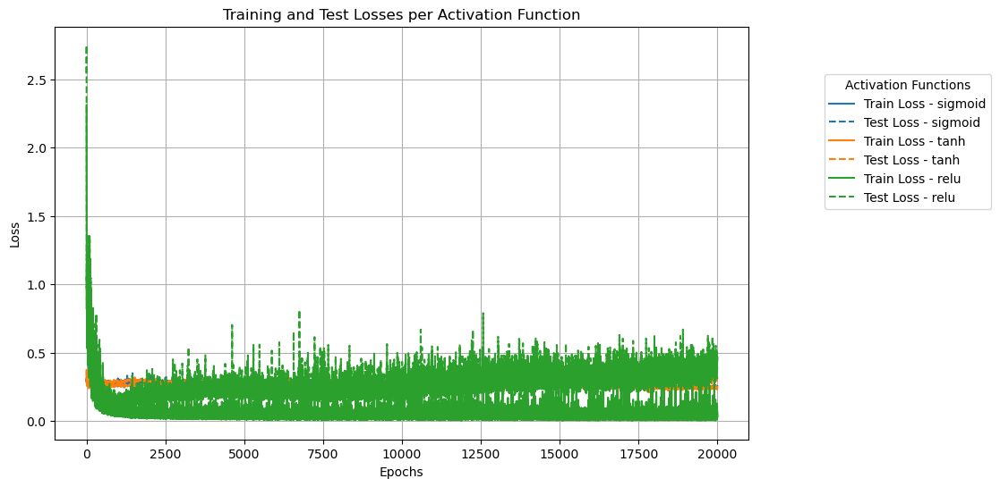

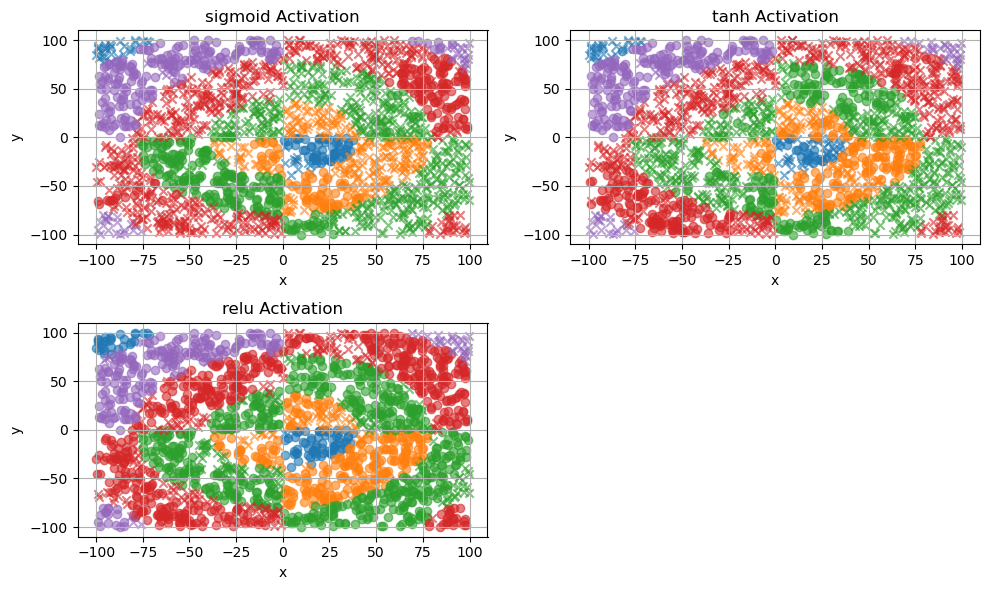

Classification Task Evaluation Metric per Activation Function


,Activation Function,Classification Task Eval Metric (Fscore)
0,sigmoid,0.34
1,tanh,0.36
2,relu,0.82


Training Time per Activation Function


,Activation Function,Training Time (seconds)
0,sigmoid,47.45
1,tanh,44.5
2,relu,38.21


In [166]:
print(f"Architecture with layers: {layers}")
visualize_results(results=results, task="classification", X_test=X_test_rings5, Y_test=Y_test_rings5, num_classes=num_classes)

While the ReLU activation function leads to noticeable overfitting—as evidenced by increasing test loss during training—it still delivers the best overall performance for this architecture on the rings5 dataset. Therefore, we will continue to use ReLU, while implementing regularization techniques to mitigate overfitting.

Epoch 0, Training Loss: 2.626524, Test Loss: 2.725629
Epoch 1000, Training Loss: 0.056061, Test Loss: 0.179321
Epoch 2000, Training Loss: 0.047256, Test Loss: 0.192548
Epoch 3000, Training Loss: 0.053209, Test Loss: 0.247729
Epoch 4000, Training Loss: 0.024016, Test Loss: 0.229470
Epoch 5000, Training Loss: 0.051319, Test Loss: 0.224704
Epoch 6000, Training Loss: 0.023112, Test Loss: 0.230159
Epoch 7000, Training Loss: 0.093408, Test Loss: 0.276713
Epoch 8000, Training Loss: 0.045573, Test Loss: 0.285304
Epoch 9000, Training Loss: 0.058888, Test Loss: 0.290536
Epoch 10000, Training Loss: 0.048520, Test Loss: 0.295691
Epoch 11000, Training Loss: 0.039662, Test Loss: 0.262939
Epoch 12000, Training Loss: 0.031239, Test Loss: 0.245730
Epoch 13000, Training Loss: 0.035417, Test Loss: 0.275374
Epoch 14000, Training Loss: 0.094483, Test Loss: 0.376352
Epoch 15000, Training Loss: 0.048387, Test Loss: 0.299027
Epoch 16000, Training Loss: 0.015725, Test Loss: 0.286705
Epoch 17000, Training Loss:

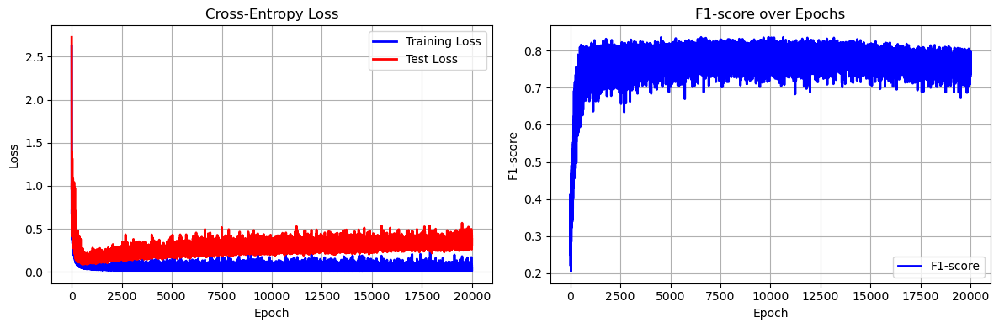

In [49]:
nn_rings5= NeuralNetwork(task="classification", layers=[2, 20, num_classes], activation='relu',weights_initialize='He')
nn_rings5.train(X_train=X_train_rings5, y_train=Y_train_rings5, X_test=X_test_rings5, y_test=Y_test_rings5, 
                optimizer="RMSprop", learning_rate=0.01, epochs=20000, 
                verbose_interval=1000, batch_size=32)

Test F1 score: 0.77


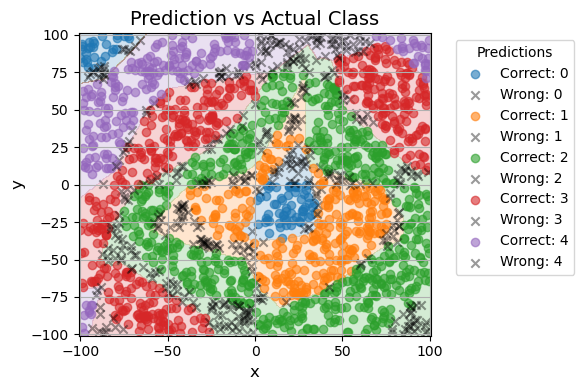

In [51]:
print(f"Test F1 score: {nn_rings5.Fscore(X_test_rings5, Y_test_rings5):.2f}")
Y_pred=nn_rings5.predict(X_test_rings5)
visualize_predictions_classification(nn_rings5, X_test_rings5, Y_test_rings5, Y_pred, num_classes)

overfitting prevention -> early stopping

Epoch 0, Training Loss: 2.078457, Test Loss: 1.681440
Epoch 1000, Training Loss: 0.097933, Test Loss: 0.227357
Early stopping due to no improvment in test loss after 1000 epochs


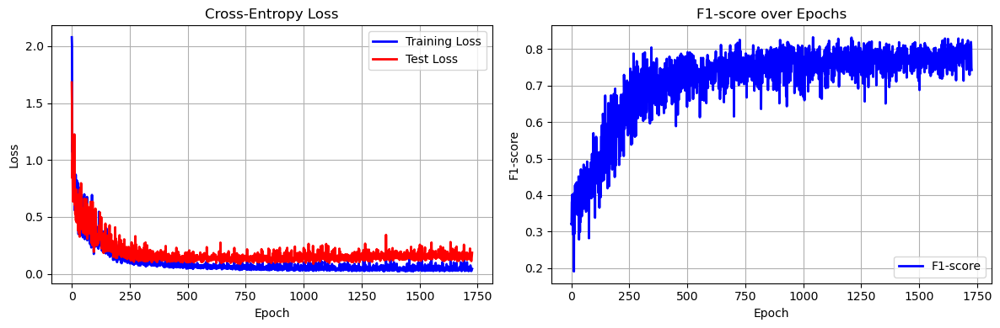

In [52]:
nn_rings5_early_stopping= NeuralNetwork(task="classification", layers=[2, 20, num_classes], activation='relu',weights_initialize='He')
nn_rings5_early_stopping.train(X_train=X_train_rings5, y_train=Y_train_rings5, X_test=X_test_rings5, y_test=Y_test_rings5, 
                optimizer="RMSprop", learning_rate=0.01, epochs=20000, 
                verbose_interval=1000, batch_size=32,
                early_stopping=True, patience=1000)

Test F1 score: 0.82


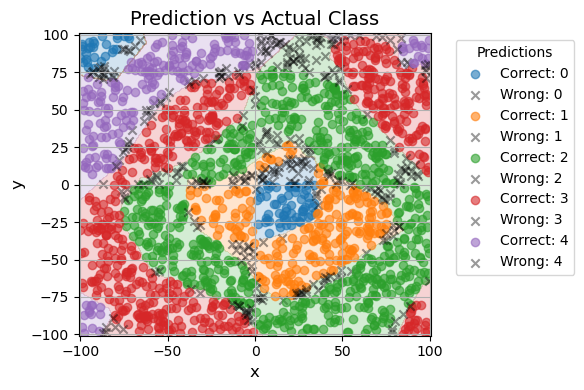

In [53]:
print(f"Test F1 score: {nn_rings5_early_stopping.Fscore(X_test_rings5, Y_test_rings5):.2f}")
Y_pred=nn_rings5_early_stopping.predict(X_test_rings5)
visualize_predictions_classification(nn_rings5_early_stopping, X_test_rings5, Y_test_rings5, Y_pred, num_classes)

improvement in F1 score, also no overefitting spotted on training plot

regularization

L1

In [166]:
results_rings5_L1=train_architecture_with_regularization(X_train=X_train_rings5, Y_train=Y_train_rings5, X_test=X_test_rings5, Y_test=Y_test_rings5, 
                              task='classification', layers=[2, 20, num_classes], activation_function='relu', 
                              epochs=20000, batch_size=32, learning_rate=0.01, optimizer="RMSprop", 
                              regularization_types=['L1'], regularization_values=[[0.00, 0.0001, 0.001, 0.01, 0.1, 1.0]])

Training with regularization: L1
  λ = 0.0
  λ = 0.0001
  λ = 0.001
  λ = 0.01
  λ = 0.1
  λ = 1.0


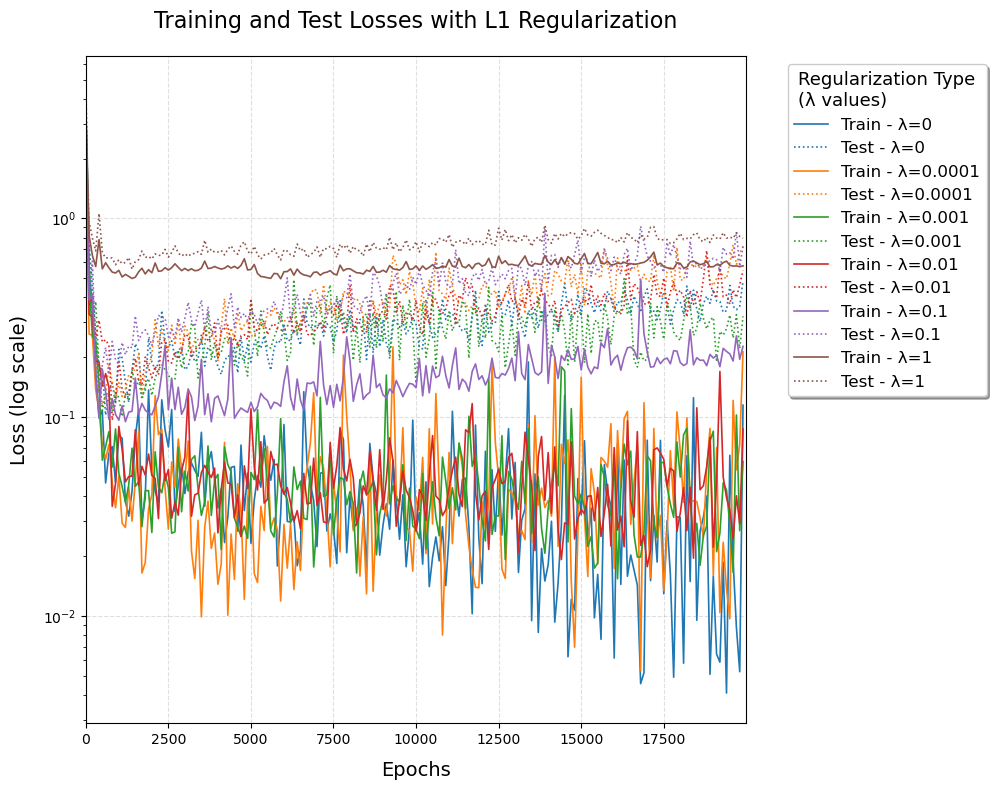

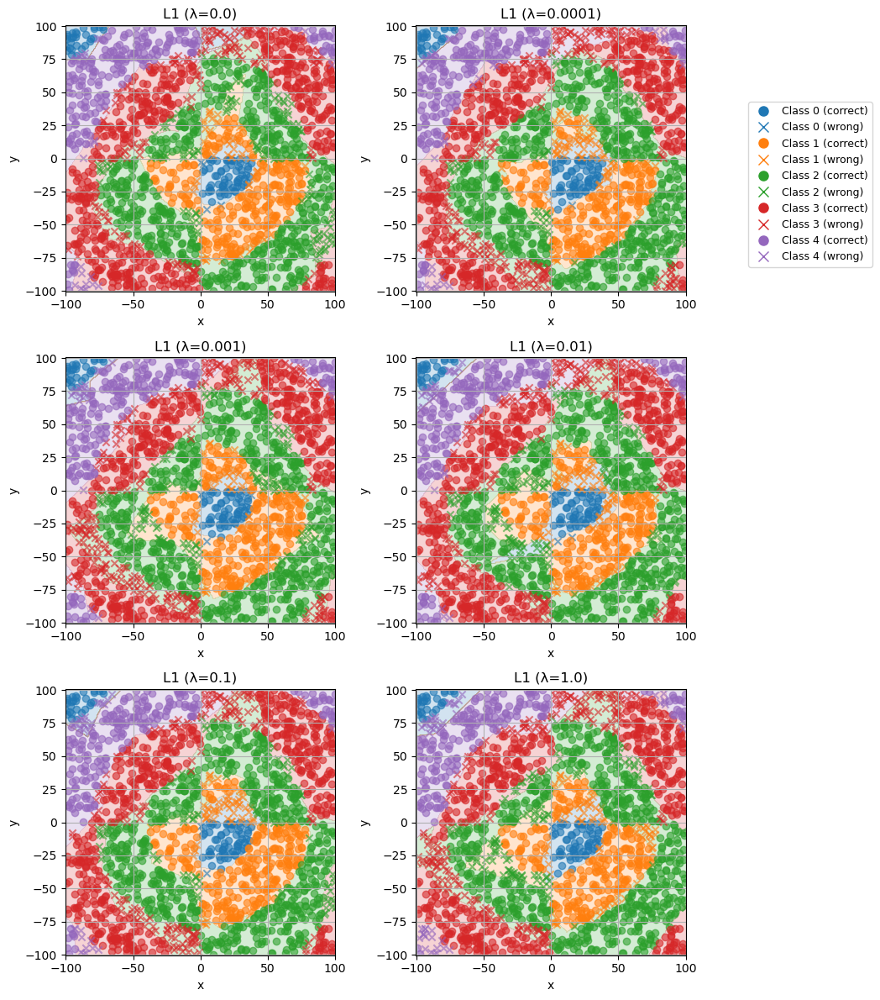

Classification Task Evaluation Metric per Regularization


,Regularization,Classification Eval Metric (Fscore)
0,L1 (λ=0.0),0.81
1,L1 (λ=0.0001),0.81
2,L1 (λ=0.001),0.78
3,L1 (λ=0.01),0.78
4,L1 (λ=0.1),0.83
5,L1 (λ=1.0),0.76


Training Time per Regularization


,Regularization,Training Time (s)
0,L1 (λ=0.0),80.76
1,L1 (λ=0.0001),78.67
2,L1 (λ=0.001),79.63
3,L1 (λ=0.01),78.97
4,L1 (λ=0.1),78.82
5,L1 (λ=1.0),77.82


In [167]:
visualize_regularization_results(results_rings5_L1, task="classification", X_test=X_test_rings5, Y_test=Y_test_rings5, num_classes=5, log_scale=True)

L2 regularization

In [169]:
results_rings5_L2=train_architecture_with_regularization(X_train=X_train_rings5, Y_train=Y_train_rings5, X_test=X_test_rings5, Y_test=Y_test_rings5, 
                              task='classification', layers=[2, 20, num_classes], activation_function='relu', 
                              epochs=20000, batch_size=32, learning_rate=0.01, optimizer="RMSprop", 
                              regularization_types=['L2'], regularization_values=[[0.00, 0.0001, 0.001, 0.01, 0.1, 1.0]])

Training with regularization: L2
  λ = 0.0
  λ = 0.0001
  λ = 0.001
  λ = 0.01
  λ = 0.1
  λ = 1.0


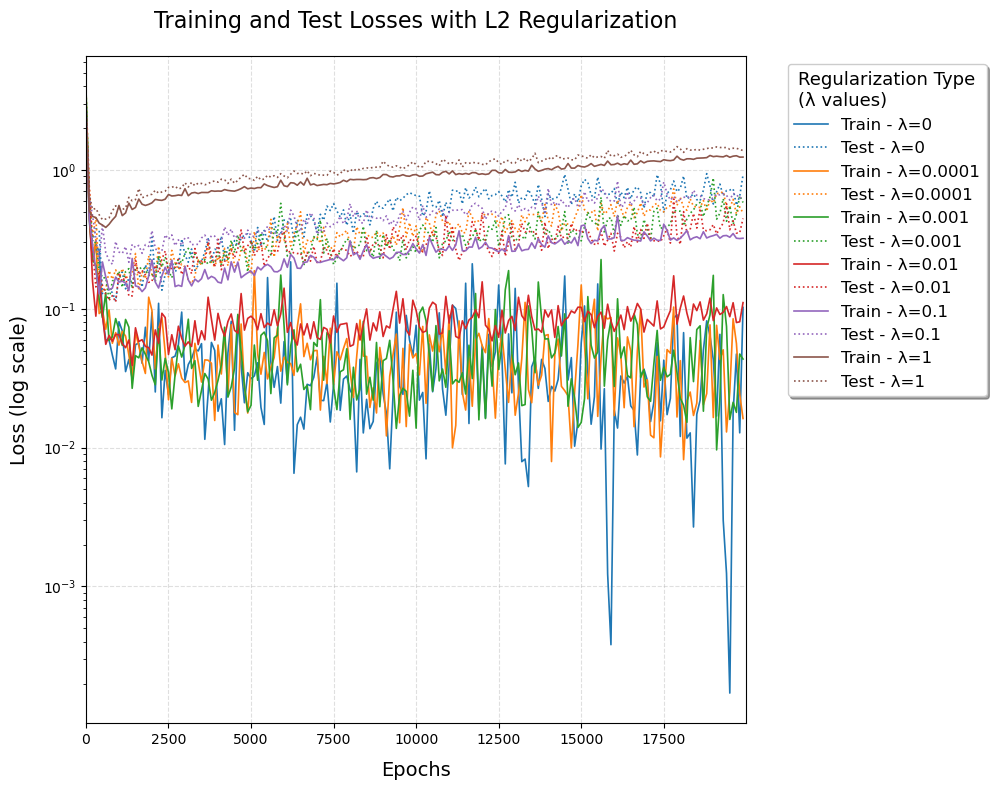

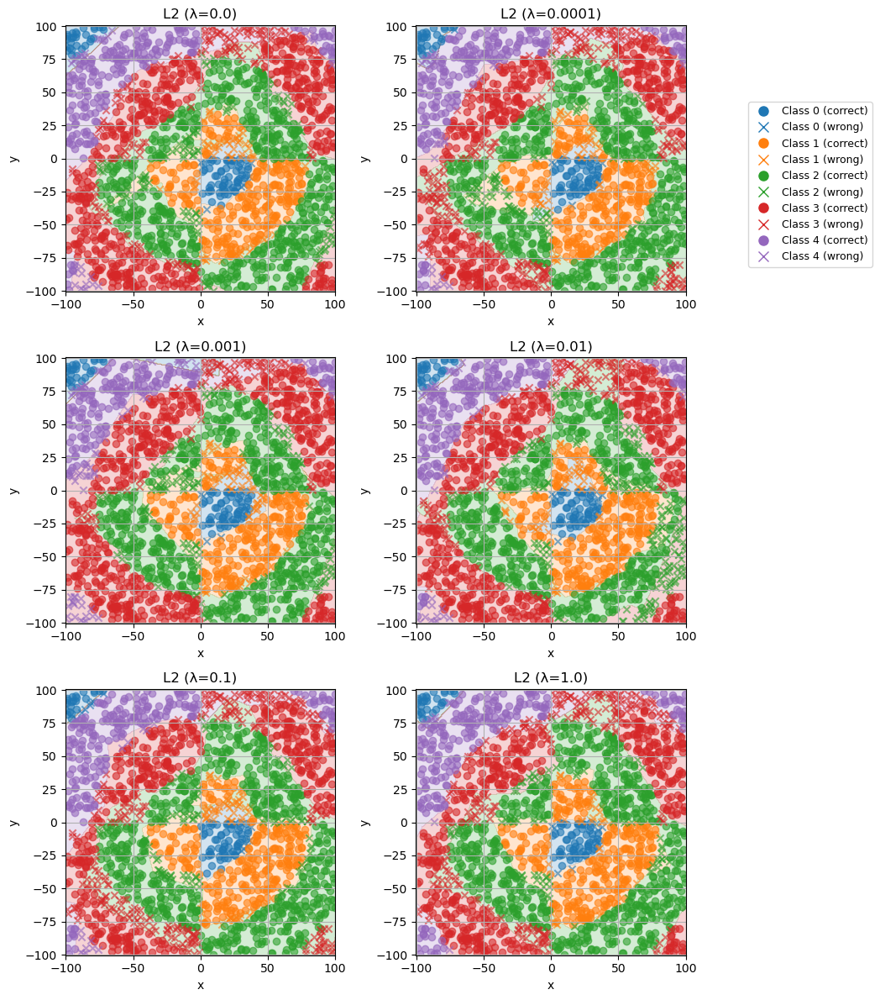

Classification Task Evaluation Metric per Regularization


,Regularization,Classification Eval Metric (Fscore)
0,L2 (λ=0.0),0.82
1,L2 (λ=0.0001),0.79
2,L2 (λ=0.001),0.82
3,L2 (λ=0.01),0.8
4,L2 (λ=0.1),0.78
5,L2 (λ=1.0),0.81


Training Time per Regularization


,Regularization,Training Time (s)
0,L2 (λ=0.0),79.95
1,L2 (λ=0.0001),79.66
2,L2 (λ=0.001),79.44
3,L2 (λ=0.01),79.1
4,L2 (λ=0.1),76.97
5,L2 (λ=1.0),77.48


In [170]:
visualize_regularization_results(results_rings5_L2, task="classification", X_test=X_test_rings5, Y_test=Y_test_rings5, num_classes=5, log_scale=True)

#### Rings3-balance dataset

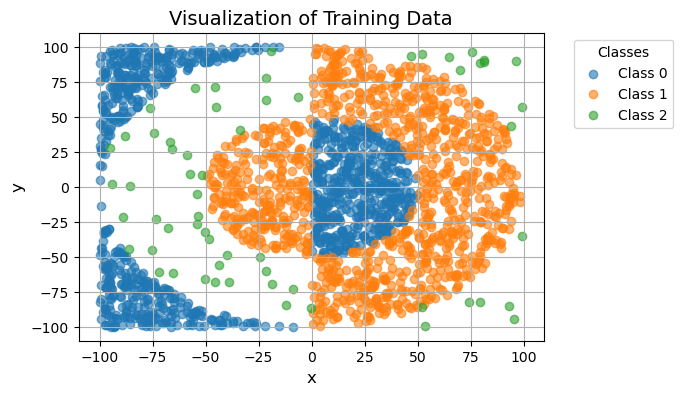

In [171]:
rings3_training_path='data/rings3-balance-training.csv'
rings3_test_path='data/rings3-balance-test.csv'

X_train_rings3, Y_train_rings3, X_test_rings3, Y_test_rings3, num_classes=load_data_classification(rings3_training_path, rings3_test_path, index_col=None)

visualize_data_classification(X_train_rings3, Y_train_rings3, num_classes)

In [18]:
#architectures from nn5
activations=['sigmoid', 'tanh', 'relu']
#defining model parameters
task = 'classification'
layers = [2, 10, 10, 10, num_classes]
epochs = 2000
batch_size = 32
learning_rate = 0.0001
optimizer = 'RMSprop'
results = train_architecture_with_activation_functions(activations=activations, task=task, layers=layers, epochs=epochs, 
                                             batch_size=batch_size, learning_rate=learning_rate, optimizer=optimizer,
                                             X_train=X_train_rings3, Y_train=Y_train_rings3,
                                             X_test=X_test_rings3, Y_test=Y_test_rings3)

Training architecture with sigmoid
Training architecture with tanh
Training architecture with relu


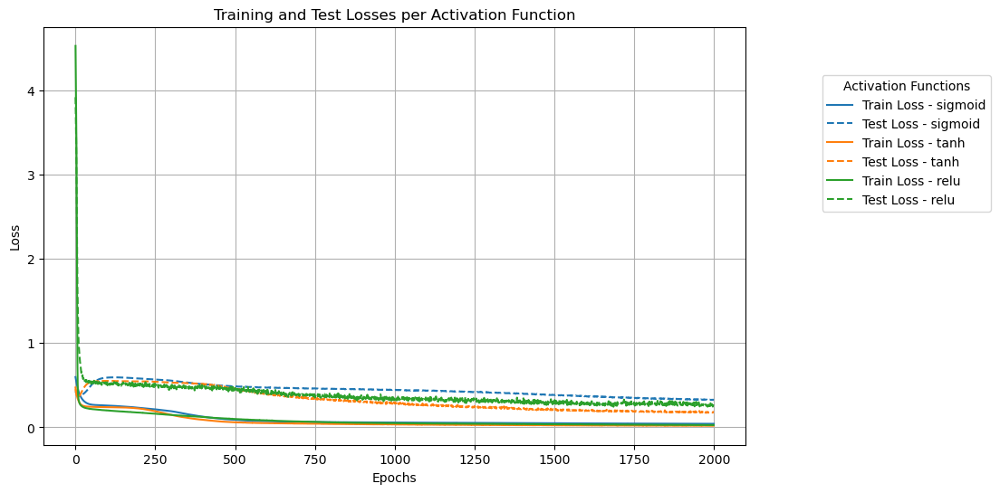

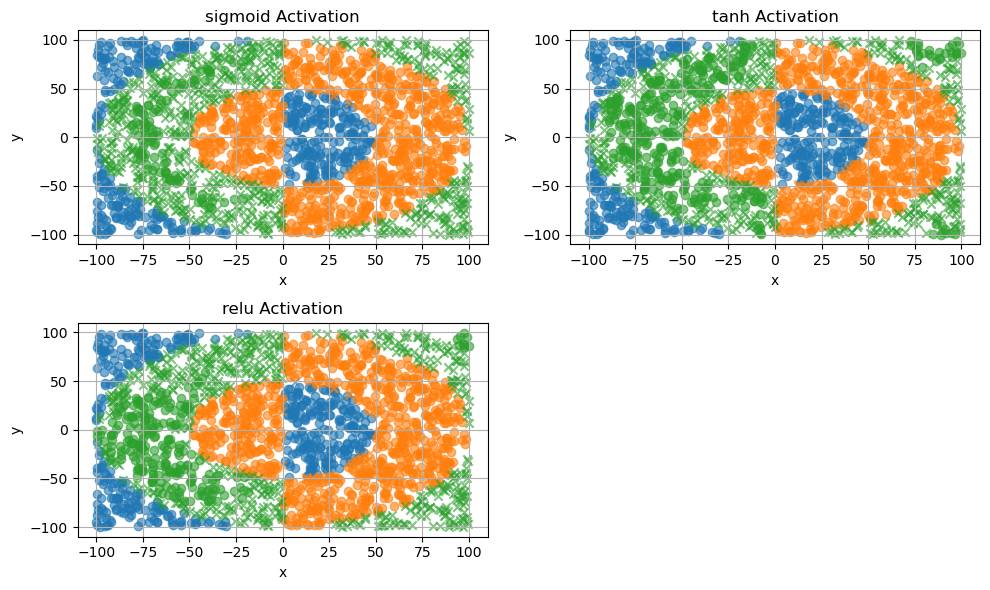

Classification Task Evaluation Metric per Activation Function


,Activation Function,Classification Task Eval Metric (Fscore)
0,sigmoid,0.66
1,tanh,0.78
2,relu,0.72


Training Time per Activation Function


,Activation Function,Training Time (seconds)
0,sigmoid,64.2
1,tanh,62.79
2,relu,53.08


In [19]:
visualize_results(results=results, task="classification", X_test=X_test_rings3, Y_test=Y_test_rings3, num_classes=num_classes)

Epoch 0, Training Loss: 10.797415, Test Loss: 6.934214
Epoch 1000, Training Loss: 0.083153, Test Loss: 0.445398
Epoch 2000, Training Loss: 0.048217, Test Loss: 0.352144
Epoch 3000, Training Loss: 0.031150, Test Loss: 0.272430
Epoch 4000, Training Loss: 0.021130, Test Loss: 0.173033
Epoch 5000, Training Loss: 0.016128, Test Loss: 0.165613
Epoch 6000, Training Loss: 0.013885, Test Loss: 0.174747
Epoch 7000, Training Loss: 0.011597, Test Loss: 0.150061
Epoch 8000, Training Loss: 0.011380, Test Loss: 0.182330
Epoch 9000, Training Loss: 0.008941, Test Loss: 0.131983
Epoch 10000, Training Loss: 0.008298, Test Loss: 0.128765
Epoch 11000, Training Loss: 0.007801, Test Loss: 0.153539
Epoch 12000, Training Loss: 0.006781, Test Loss: 0.161994
Epoch 13000, Training Loss: 0.005977, Test Loss: 0.178914
Epoch 14000, Training Loss: 0.007282, Test Loss: 0.188098
Epoch 15000, Training Loss: 0.004916, Test Loss: 0.220235
Epoch 16000, Training Loss: 0.004710, Test Loss: 0.243035
Epoch 17000, Training Loss

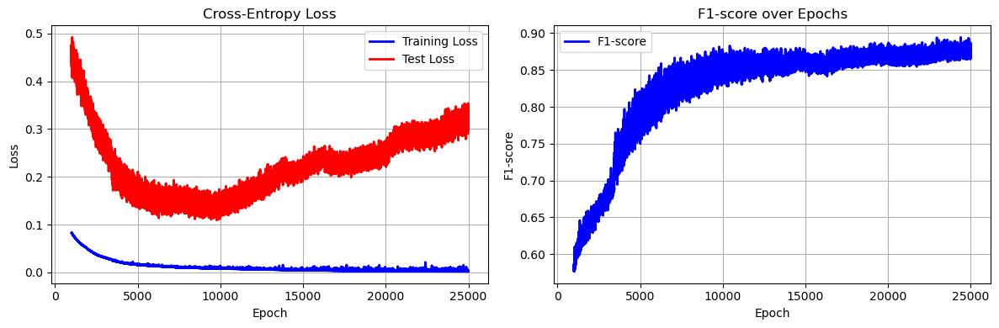

In [137]:
nn_rings3= NeuralNetwork(task="classification", layers=[2, 10, 10, 10, num_classes], 
                         activation='relu',weights_initialize='He')
nn_rings3.train(X_train=X_train_rings3, y_train=Y_train_rings3, X_test=X_test_rings3, y_test=Y_test_rings3, 
                optimizer="RMSprop", learning_rate=0.0001, epochs=25000, n_last_training_epochs=24000,
                verbose_interval=1000, batch_size=64)

Test F1 score: 0.87


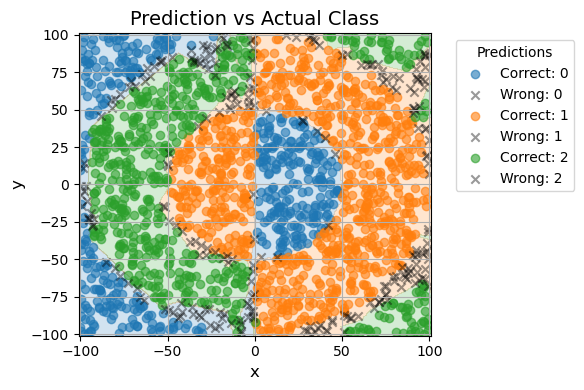

In [138]:
print(f"Test F1 score: {nn_rings3.Fscore(X_test_rings3, Y_test_rings3):.2f}")
Y_pred=nn_rings3.predict(X_test_rings3)
visualize_predictions_classification(nn_rings3, X_test_rings3, Y_test_rings3, Y_pred, num_classes)

Epoch 0, Training Loss: 6.886449, Test Loss: 4.478617
Epoch 1000, Training Loss: 0.041885, Test Loss: 0.329397
Epoch 2000, Training Loss: 0.024824, Test Loss: 0.239482
Epoch 3000, Training Loss: 0.022044, Test Loss: 0.193337
Epoch 4000, Training Loss: 0.014862, Test Loss: 0.217828
Epoch 5000, Training Loss: 0.010857, Test Loss: 0.183671
Epoch 6000, Training Loss: 0.008504, Test Loss: 0.181411
Epoch 7000, Training Loss: 0.006746, Test Loss: 0.171114
Epoch 8000, Training Loss: 0.006266, Test Loss: 0.190667
Epoch 9000, Training Loss: 0.006139, Test Loss: 0.179054
Epoch 10000, Training Loss: 0.004386, Test Loss: 0.208096
Epoch 11000, Training Loss: 0.003935, Test Loss: 0.228702
Epoch 12000, Training Loss: 0.003611, Test Loss: 0.264559
Epoch 13000, Training Loss: 0.003361, Test Loss: 0.276116
Epoch 14000, Training Loss: 0.003239, Test Loss: 0.297111
Epoch 15000, Training Loss: 0.002683, Test Loss: 0.279075
Epoch 16000, Training Loss: 0.003179, Test Loss: 0.353669
Epoch 17000, Training Loss:

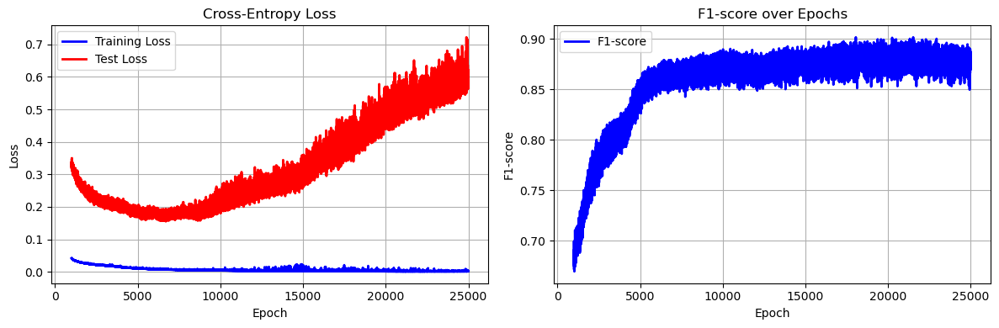

In [162]:
nn_rings3= NeuralNetwork(task="classification", layers=[2, 10, 10, 10, num_classes], 
                         activation='relu',weights_initialize='He')
nn_rings3.train(X_train=X_train_rings3, y_train=Y_train_rings3, X_test=X_test_rings3, y_test=Y_test_rings3, 
                optimizer="RMSprop", learning_rate=0.0001, epochs=25000, n_last_training_epochs=24000,
                verbose_interval=1000, batch_size=64)

Test F1 score: 0.87


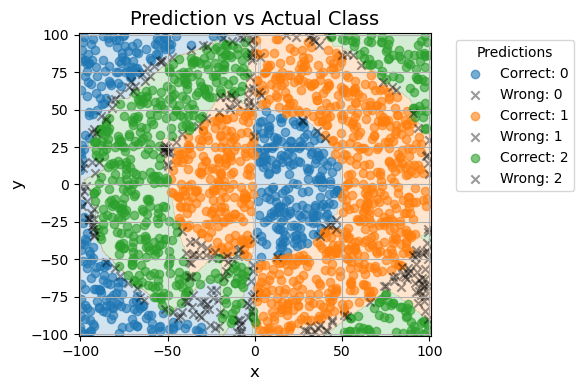

In [163]:
print(f"Test F1 score: {nn_rings3.Fscore(X_test_rings3, Y_test_rings3):.2f}")
Y_pred=nn_rings3.predict(X_test_rings3)
visualize_predictions_classification(nn_rings3, X_test_rings3, Y_test_rings3, Y_pred, num_classes)

overfit

early stopping

Epoch 0, Training Loss: 5.369831, Test Loss: 4.664067
Epoch 1000, Training Loss: 0.051699, Test Loss: 0.304621
Epoch 2000, Training Loss: 0.026970, Test Loss: 0.220721
Epoch 3000, Training Loss: 0.018781, Test Loss: 0.164753
Epoch 4000, Training Loss: 0.015379, Test Loss: 0.135844
Early stopping due to no improvment in test loss after 1000 epochs


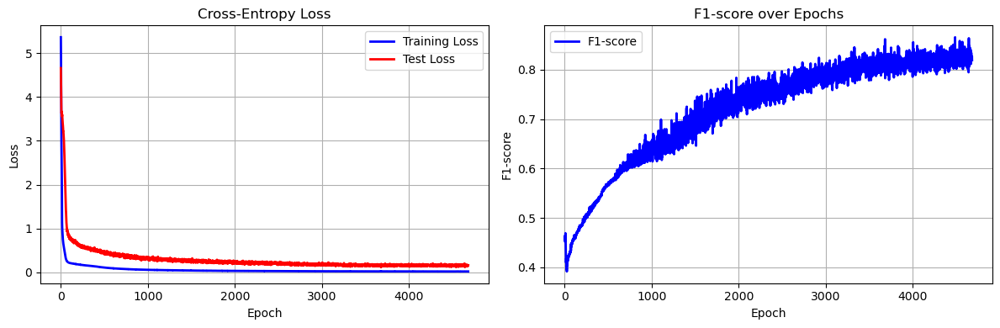

In [172]:
nn_rings3_early_stopping= NeuralNetwork(task="classification", layers=[2, 10, 10, 10, num_classes], 
                                        activation='relu',weights_initialize='He')
nn_rings3_early_stopping.train(X_train=X_train_rings3, y_train=Y_train_rings3, X_test=X_test_rings3, y_test=Y_test_rings3, 
                optimizer="RMSprop", learning_rate=0.0001, epochs=25000, 
                verbose_interval=1000, batch_size=64,
                early_stopping=True, patience=1000)

Test F1 score: 0.86


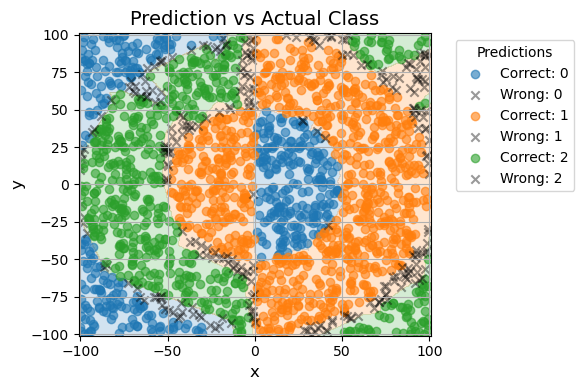

In [173]:
print(f"Test F1 score: {nn_rings3_early_stopping.Fscore(X_test_rings3, Y_test_rings3):.2f}")
Y_pred=nn_rings3_early_stopping.predict(X_test_rings3)
visualize_predictions_classification(nn_rings3_early_stopping, X_test_rings3, Y_test_rings3, Y_pred, num_classes)

test regularization

In [172]:
results_rings3_L1=train_architecture_with_regularization(X_train=X_train_rings3, Y_train=Y_train_rings3, X_test=X_test_rings3, Y_test=Y_test_rings3, 
                              task='classification', layers=[2, 10, 10, 10, num_classes], activation_function='relu', 
                              epochs=25000, batch_size=64, learning_rate=0.0001, optimizer="RMSprop", 
                              regularization_types=['L1'], regularization_values=[[0.00, 0.0001, 0.001, 0.01, 0.1, 1.0]])

Training with regularization: L1
  λ = 0.0
  λ = 0.0001
  λ = 0.001
  λ = 0.01
  λ = 0.1
  λ = 1.0


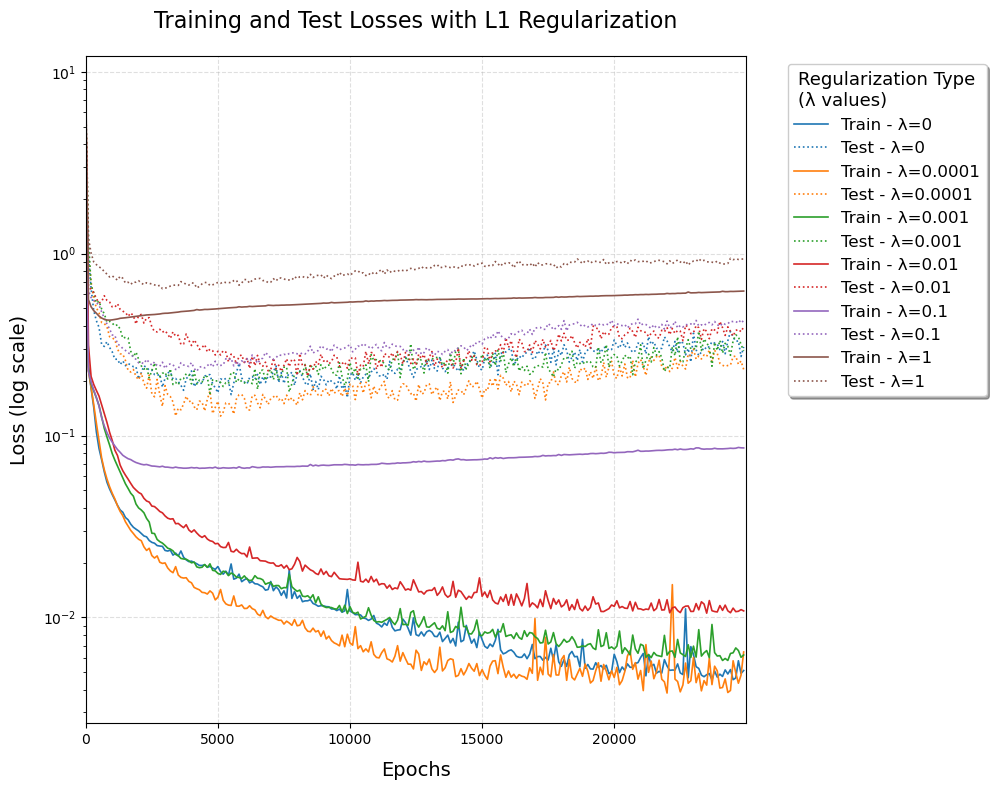

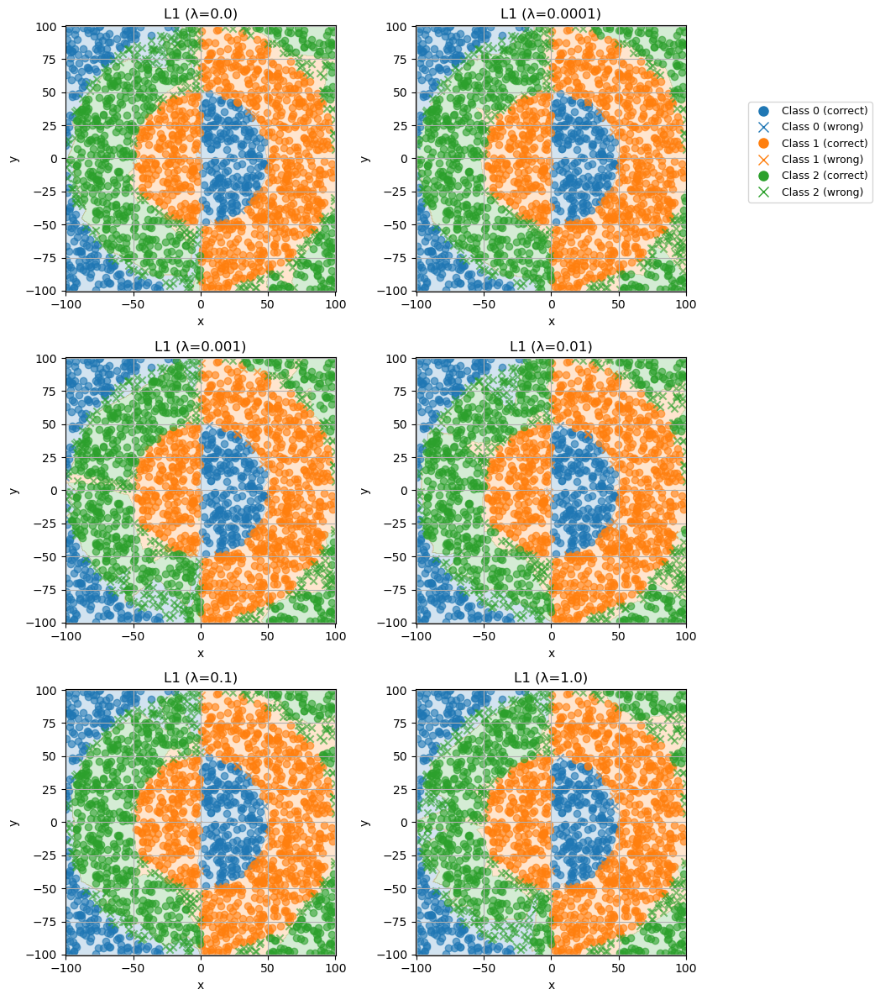

Classification Task Evaluation Metric per Regularization


,Regularization,Classification Eval Metric (Fscore)
0,L1 (λ=0.0),0.87
1,L1 (λ=0.0001),0.89
2,L1 (λ=0.001),0.86
3,L1 (λ=0.01),0.85
4,L1 (λ=0.1),0.88
5,L1 (λ=1.0),0.85


Training Time per Regularization


,Regularization,Training Time (s)
0,L1 (λ=0.0),375.6
1,L1 (λ=0.0001),356.64
2,L1 (λ=0.001),358.7
3,L1 (λ=0.01),350.54
4,L1 (λ=0.1),349.14
5,L1 (λ=1.0),360.15


In [173]:
visualize_regularization_results(results_rings3_L1, task="classification", X_test=X_test_rings3, Y_test=Y_test_rings3, num_classes=3, log_scale=True)

In [174]:
results_rings3_L2=train_architecture_with_regularization(X_train=X_train_rings3, Y_train=Y_train_rings3, X_test=X_test_rings3, Y_test=Y_test_rings3, 
                              task='classification', layers=[2, 10, 10, 10, num_classes], activation_function='relu', 
                              epochs=25000, batch_size=64, learning_rate=0.0001, optimizer="RMSprop", 
                              regularization_types=['L2'], regularization_values=[[0.00, 0.0001, 0.001, 0.01, 0.1, 1.0]])

Training with regularization: L2
  λ = 0.0
  λ = 0.0001
  λ = 0.001
  λ = 0.01
  λ = 0.1
  λ = 1.0


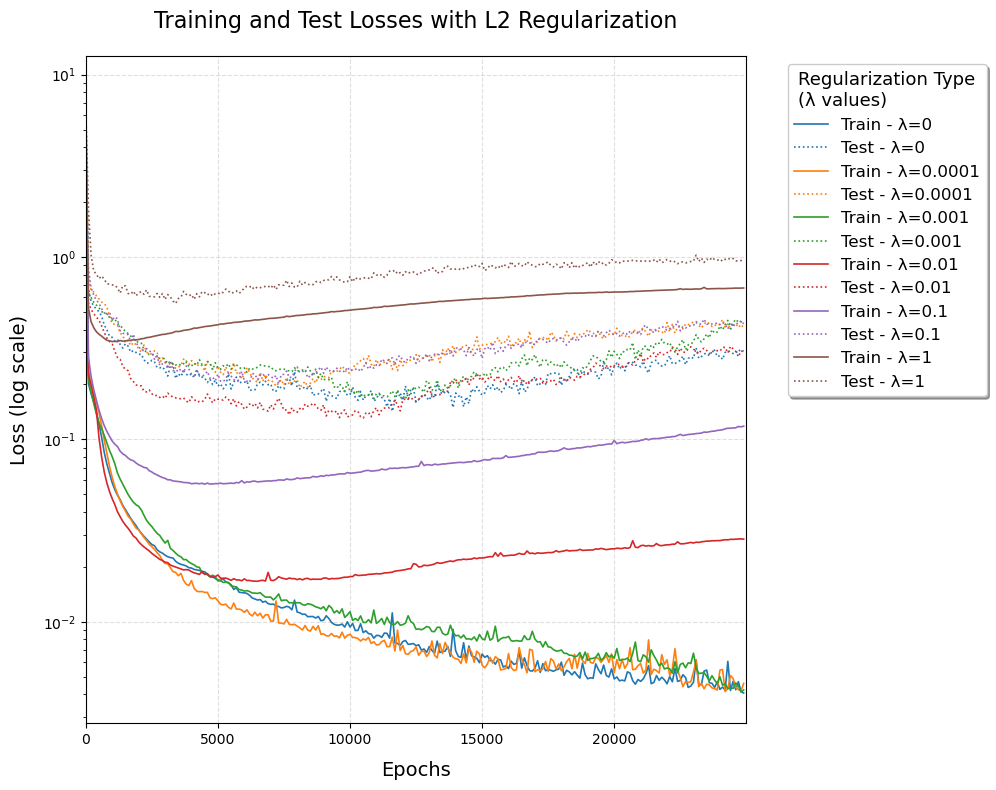

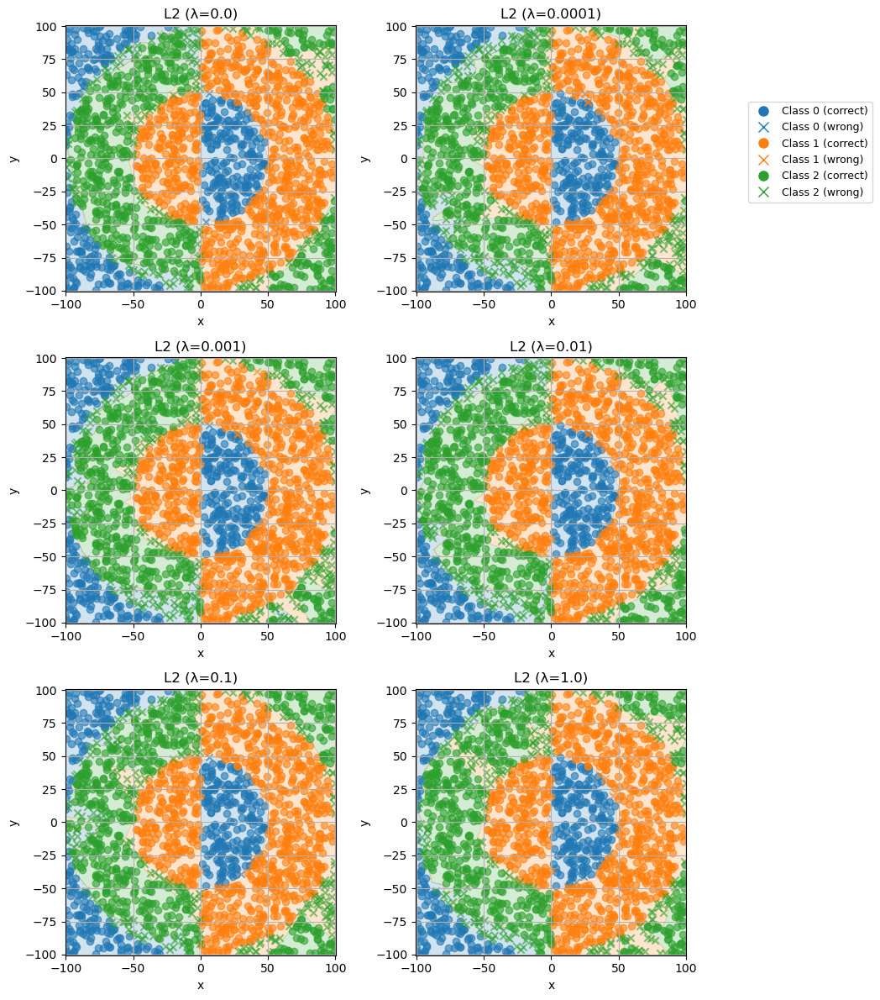

Classification Task Evaluation Metric per Regularization


,Regularization,Classification Eval Metric (Fscore)
0,L2 (λ=0.0),0.89
1,L2 (λ=0.0001),0.84
2,L2 (λ=0.001),0.87
3,L2 (λ=0.01),0.88
4,L2 (λ=0.1),0.86
5,L2 (λ=1.0),0.85


Training Time per Regularization


,Regularization,Training Time (s)
0,L2 (λ=0.0),358.19
1,L2 (λ=0.0001),343.95
2,L2 (λ=0.001),327.45
3,L2 (λ=0.01),326.42
4,L2 (λ=0.1),318.83
5,L2 (λ=1.0),324.03


In [175]:
visualize_regularization_results(results_rings3_L2, task="classification", X_test=X_test_rings3, Y_test=Y_test_rings3, num_classes=3, log_scale=True)

#### Xor dataset

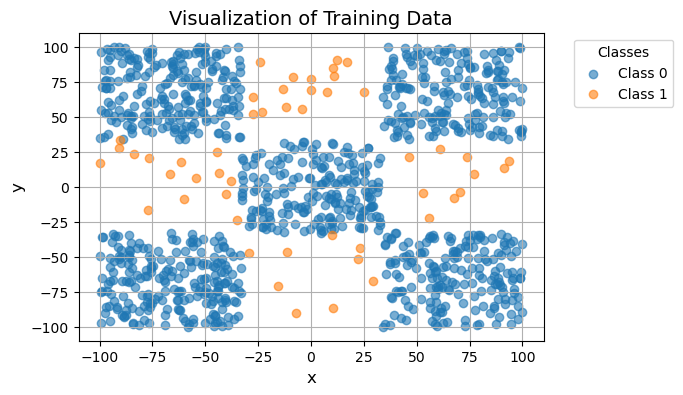

In [142]:
xor_training_path='data/xor3-balance-training.csv'
xor_test_path='data/xor3-balance-test.csv'

X_train_xor, Y_train_xor, X_test_xor, Y_test_xor, num_classes=load_data_classification(xor_training_path, xor_test_path, index_col=None)

visualize_data_classification(X_train_xor, Y_train_xor, num_classes)

trying architectures from nn4 where we could see overfitting

Epoch 0, Training Loss: 0.217556, Test Loss: 0.577666
Epoch 1000, Training Loss: 0.035033, Test Loss: 0.474288
Epoch 2000, Training Loss: 0.027068, Test Loss: 0.510541
Epoch 3000, Training Loss: 0.018789, Test Loss: 0.504709
Epoch 4000, Training Loss: 0.014510, Test Loss: 0.478841
Epoch 5000, Training Loss: 0.013259, Test Loss: 0.556203
Epoch 6000, Training Loss: 0.009780, Test Loss: 0.507496
Epoch 7000, Training Loss: 0.009998, Test Loss: 0.521782
Epoch 8000, Training Loss: 0.005974, Test Loss: 0.474351
Epoch 9000, Training Loss: 0.005404, Test Loss: 0.497452
Epoch 10000, Training Loss: 0.008896, Test Loss: 0.603465
Epoch 11000, Training Loss: 0.004905, Test Loss: 0.548755
Epoch 12000, Training Loss: 0.004875, Test Loss: 0.580215
Epoch 13000, Training Loss: 0.004651, Test Loss: 0.572708
Epoch 14000, Training Loss: 0.004547, Test Loss: 0.596210
Epoch 15000, Training Loss: 0.006815, Test Loss: 0.700089
Epoch 16000, Training Loss: 0.004251, Test Loss: 0.605120
Epoch 17000, Training Loss:

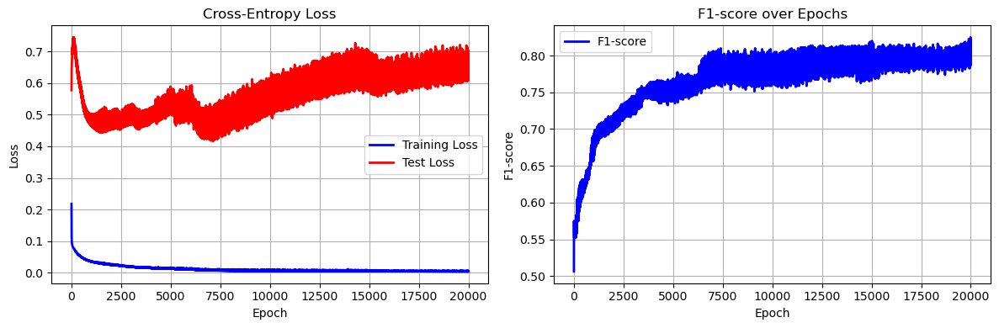

In [216]:
nn_xor=NeuralNetwork(layers=[2,30,num_classes], task="classification", 
                     activation="sigmoid", weights_initialize="Xavier")
nn_xor.train(X_train_xor, Y_train_xor, X_test_xor, Y_test_xor, optimizer="RMSprop", 
               learning_rate=0.005, epochs=20000, verbose_interval=1000, batch_size=None)

Test F1 score: 0.80


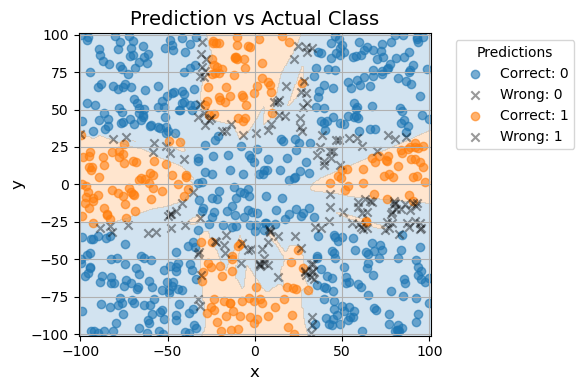

In [217]:
print(f"Test F1 score: {nn_xor.Fscore(X_test_xor, Y_test_xor):.2f}")
Y_pred=nn_xor.predict(X_test_xor)
visualize_predictions_classification(nn_xor, X_test_xor, Y_test_xor, Y_pred, num_classes)

The rising test loss despite decreasing training loss unambiguously indicates overfitting, suggesting the model is losing its generalization capability as training progresses.

early stopping

Epoch 0, Training Loss: 0.575186, Test Loss: 0.420624
Epoch 1000, Training Loss: 0.030333, Test Loss: 0.385507
Epoch 2000, Training Loss: 0.016496, Test Loss: 0.296101
Epoch 3000, Training Loss: 0.013531, Test Loss: 0.319686
Early stopping due to no improvment in test loss after 1000 epochs


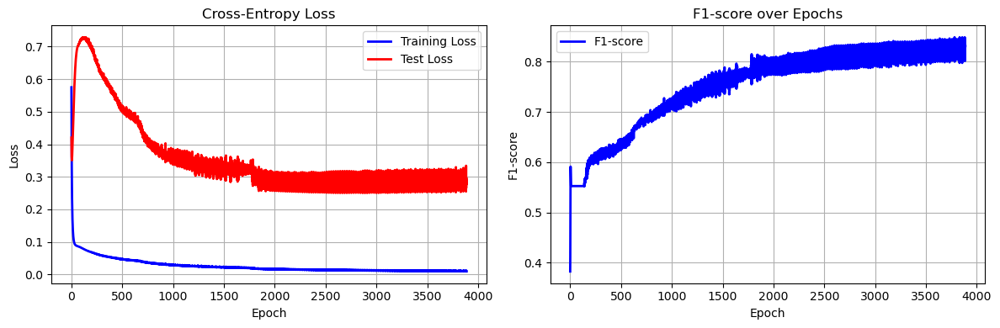

In [49]:
nn_xor_early_stopping=NeuralNetwork(layers=[2,30,num_classes], task="classification", 
                     activation="sigmoid", weights_initialize="Xavier")
nn_xor_early_stopping.train(X_train_xor, Y_train_xor, X_test_xor, Y_test_xor, optimizer="RMSprop", 
               learning_rate=0.005, epochs=20000, verbose_interval=1000, batch_size=None, early_stopping=True, patience=1000)

Test F1 score: 0.84


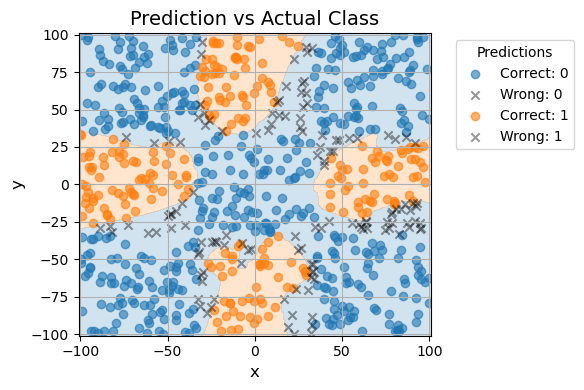

In [50]:
print(f"Test F1 score: {nn_xor_early_stopping.Fscore(X_test_xor, Y_test_xor):.2f}")
Y_pred=nn_xor_early_stopping.predict(X_test_xor)
visualize_predictions_classification(nn_xor_early_stopping, X_test_xor, Y_test_xor, Y_pred, num_classes)

Fscore from 0.80 -> 0.84, shorter time of training

L1 regularization

In [143]:
results_xor_L1=train_architecture_with_regularization(X_train=X_train_xor, Y_train=Y_train_xor, X_test=X_test_xor, Y_test=Y_test_xor, 
                              task='classification', layers=[2, 30, num_classes], activation_function='sigmoid', 
                              epochs=20000, batch_size=None, learning_rate=0.005, optimizer="RMSprop", 
                              regularization_types=['L1'], regularization_values=[[0.00, 0.0001, 0.001, 0.01, 0.1, 1.0]])

Training with regularization: L1
  λ = 0.0
  λ = 0.0001
  λ = 0.001
  λ = 0.01
  λ = 0.1
  λ = 1.0


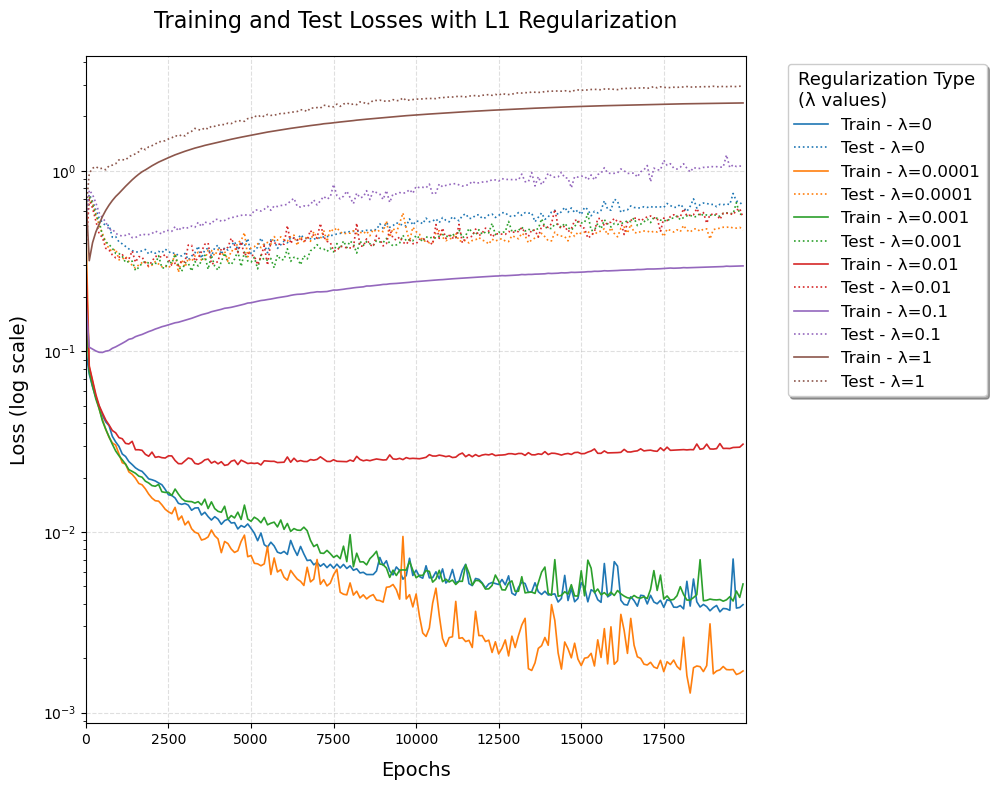

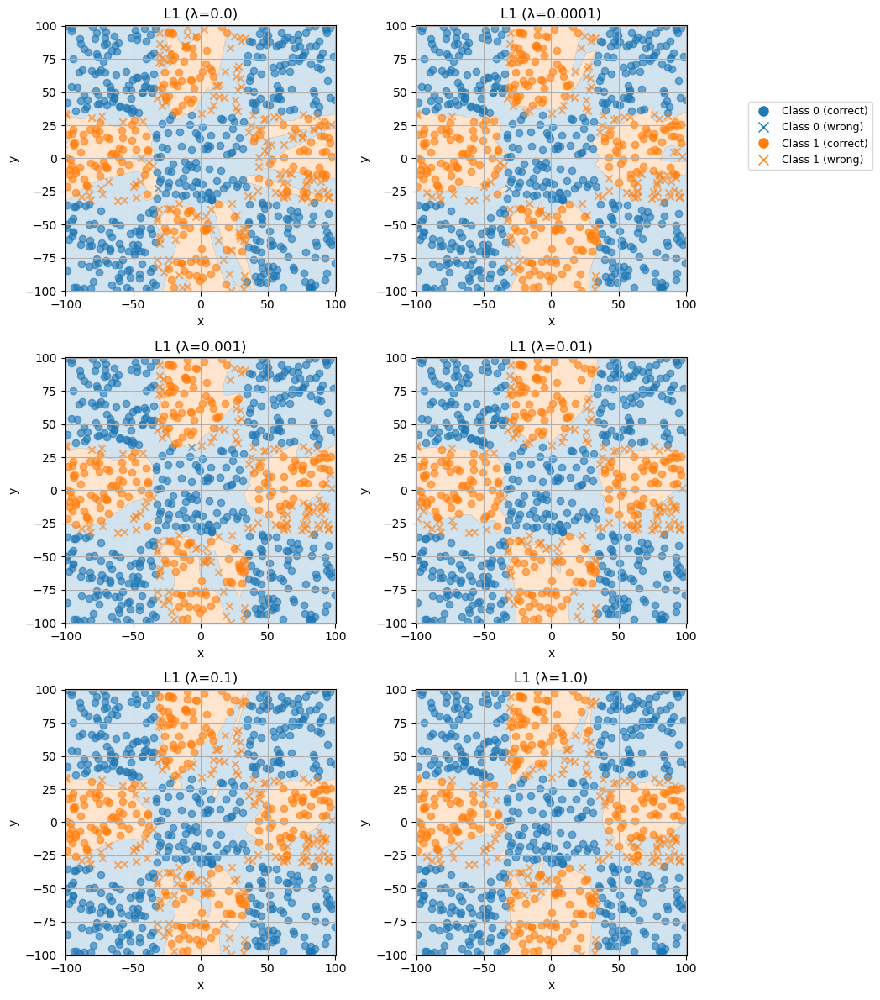

Classification Task Evaluation Metric per Regularization


,Regularization,Classification Eval Metric (Fscore)
0,L1 (λ=0.0),0.78
1,L1 (λ=0.0001),0.85
2,L1 (λ=0.001),0.82
3,L1 (λ=0.01),0.83
4,L1 (λ=0.1),0.81
5,L1 (λ=1.0),0.83


Training Time per Regularization


,Regularization,Training Time (s)
0,L1 (λ=0.0),130.88
1,L1 (λ=0.0001),101.46
2,L1 (λ=0.001),120.75
3,L1 (λ=0.01),106.43
4,L1 (λ=0.1),125.84
5,L1 (λ=1.0),178.06


In [154]:
visualize_regularization_results(results=results_xor_L1, task="classification", X_test=X_test_xor, Y_test=Y_test_xor, num_classes=num_classes, log_scale=True)

L2 regularization

In [145]:
results_xor_L2=train_architecture_with_regularization(X_train=X_train_xor, Y_train=Y_train_xor, X_test=X_test_xor, Y_test=Y_test_xor, 
                              task='classification', layers=[2, 30, num_classes], activation_function='sigmoid', 
                              epochs=20000, batch_size=None, learning_rate=0.005, optimizer="RMSprop", 
                              regularization_types=['L2'], regularization_values=[[0.00, 0.0001, 0.001, 0.01, 0.1, 1.0]])

Training with regularization: L2
  λ = 0.0
  λ = 0.0001
  λ = 0.001
  λ = 0.01
  λ = 0.1
  λ = 1.0


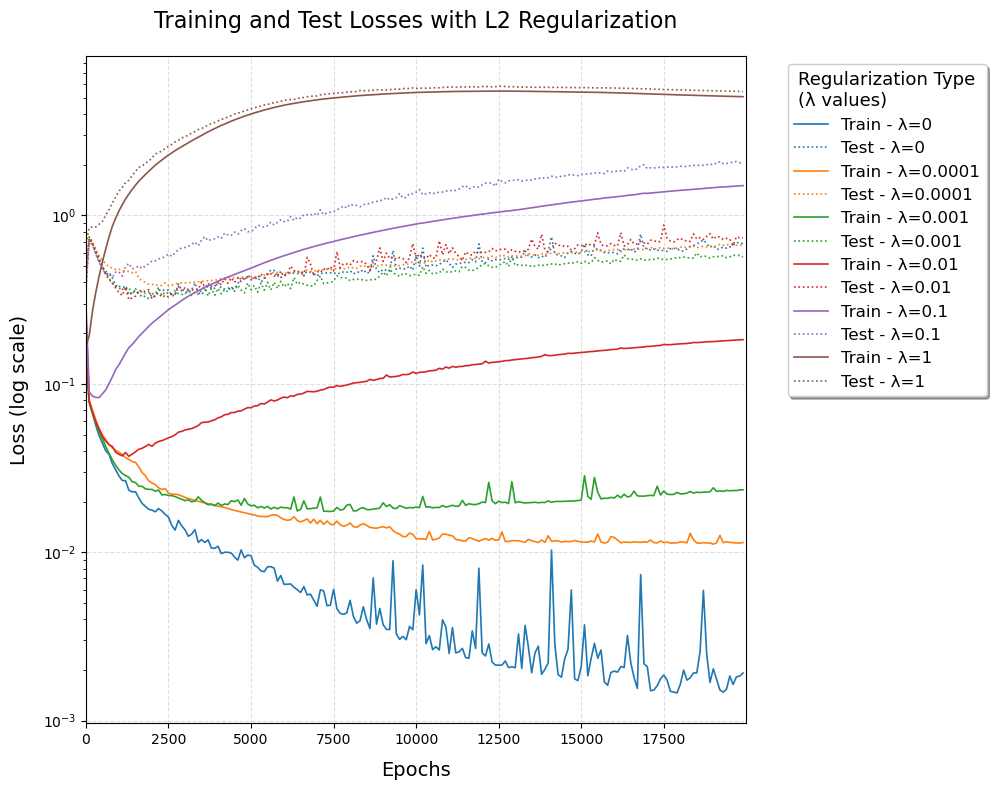

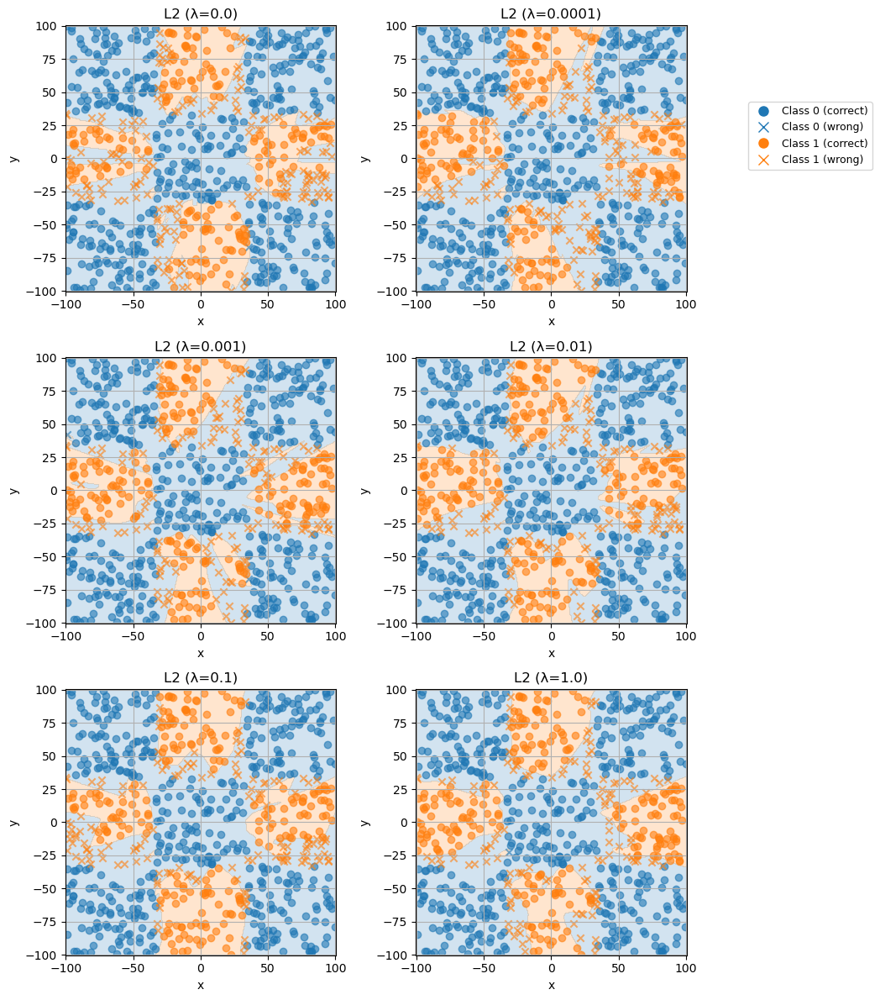

Classification Task Evaluation Metric per Regularization


,Regularization,Classification Eval Metric (Fscore)
0,L2 (λ=0.0),0.78
1,L2 (λ=0.0001),0.81
2,L2 (λ=0.001),0.83
3,L2 (λ=0.01),0.84
4,L2 (λ=0.1),0.82
5,L2 (λ=1.0),0.84


Training Time per Regularization


,Regularization,Training Time (s)
0,L2 (λ=0.0),129.7
1,L2 (λ=0.0001),124.36
2,L2 (λ=0.001),116.88
3,L2 (λ=0.01),103.21
4,L2 (λ=0.1),138.18
5,L2 (λ=1.0),121.88


In [153]:
visualize_regularization_results(results=results_xor_L2, task="classification", X_test=X_test_xor, Y_test=Y_test_xor, num_classes=num_classes, log_scale=True)